In [2]:
# Packages:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


In [3]:
# read in data:
df50 = pd.read_csv('https://raw.githubusercontent.com/britt-anderson/Data/main/1950.csv')
df60 = pd.read_csv('https://github.com/britt-anderson/Data/raw/main/1960.csv')
df70 = pd.read_csv('https://raw.githubusercontent.com/britt-anderson/Data/main/1970.csv')
df80 = pd.read_csv('https://github.com/britt-anderson/Data/raw/main/1980.csv')
df90 = pd.read_csv('https://github.com/britt-anderson/Data/raw/main/1990.csv')
df00 = pd.read_csv('https://github.com/britt-anderson/Data/raw/main/2000.csv')
df10 = pd.read_csv('https://github.com/britt-anderson/Data/raw/main/2010.csv')

dfspot2023 = pd.read_csv('https://github.com/britt-anderson/Data/raw/main/spotify-2023.csv', encoding='latin1')
dfsongs = pd.read_csv('https://github.com/britt-anderson/Data/raw/main/spotify_songs.csv')

In [4]:
# Append the decades data together:
# This will be used for our genre classifier, and also potentially to
# cluster songs into their decades

# Create a list of your DataFrames
dfs = [df50, df60, df70, df80, df90, df00, df10]

# Use the concat function to combine them along the rows
decades = pd.concat(dfs, ignore_index=True)

# remove the Number column to complete the inital cleaning
dec_df = decades.drop(columns=['Number'])

In [ ]:
# EDA for dec_df
# Display summary statistics of numeric columns
print(dec_df.describe())

# Check for missing values
# 16 NAs in Top Genre. I can't really impute that to the mean because
# it is categorical. I will just get rid of those for genre analysis
print(dec_df.isnull().sum())

# Univariate analysis: Histograms for numeric columns
dec_df.hist(figsize=(12, 8))
plt.show()

# Bivariate analysis: Pairplot for numeric columns
sns.pairplot(dec_df)
plt.show()

# Bivariate analysis: Heatmap for correlation matrix
correlation_matrix = dec_df.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.show()

# Boxplot to identify outliers in numeric columns
for column in dec_df.select_dtypes(include='number').columns:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=column, data=dec_df)
    plt.show()

#add here

In [7]:
dec_df.head()

,title,artist,top genre,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
0,Put Your Head On My Shoulder,Paul Anka,adult standards,2000,116,34,55,-9,10,47,155,75,3,72
1,Whatever Will Be Will Be (Que Sera Sera) (with...,Doris Day,adult standards,1948,177,34,42,-11,72,78,123,86,4,62
2,Everybody Loves Somebody,Dean Martin,adult standards,2013,81,49,26,-9,34,40,162,81,4,61
3,Take Good Care Of My Baby - 1990 Remastered,Bobby Vee,adult standards,2011,82,43,49,-12,12,66,151,70,6,60
4,A Teenager In Love,Dion & The Belmonts,adult standards,1959,79,38,56,-9,13,62,158,67,3,60


In [ ]:
# Cleaning dfspot2023
# I removed the track and artist names because that is not what we are looking at
# for this analysis. We are specifically looking at if we can predict a song's
# popularity based on its attributes.
top_2023 = dfspot2023.drop(columns=['track_name', 'artist(s)_name', 'artist_count',
                                    'released_year', 'released_month', 'released_day',
                                    'in_apple_playlists','in_apple_charts',
                                    'in_deezer_playlists', 'in_deezer_charts',
                                    'in_shazam_charts'])

# Remove streams entries that are not numeric.
top_2023

,in_spotify_playlists,in_spotify_charts,streams,bpm,key,mode,danceability_%,valence_%,energy_%,acousticness_%,instrumentalness_%,liveness_%,speechiness_%
0,553,147,141381703,125,B,Major,80,89,83,31,0,8,4
1,1474,48,133716286,92,C#,Major,71,61,74,7,0,10,4
2,1397,113,140003974,138,F,Major,51,32,53,17,0,31,6
3,7858,100,800840817,170,A,Major,55,58,72,11,0,11,15
4,3133,50,303236322,144,A,Minor,65,23,80,14,63,11,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
948,953,0,91473363,144,A,Major,60,24,39,57,0,8,3
949,1180,0,121871870,166,F#,Major,42,7,24,83,1,12,6
950,573,0,73513683,92,C#,Major,80,81,67,4,0,8,6
951,1320,0,133895612,97,C#,Major,82,67,77,8,0,12,5


In [ ]:
# Preprocessing for top_2023

# Add here

In [ ]:
# Cleaning dfsongs
# this data will be used more for

dfsongs.columns
# need to change the track_album_release_date to just be the year it was released

songs = dfsongs.drop(columns=['track_id', 'track_name', 'track_artist', 'track_album_id', 'track_album_name', 'track_album_release_date', ])

       track_popularity  danceability        energy           key  \
count      32833.000000  32833.000000  32833.000000  32833.000000   
mean          42.477081      0.654850      0.698619      5.374471   
std           24.984074      0.145085      0.180910      3.611657   
min            0.000000      0.000000      0.000175      0.000000   
25%           24.000000      0.563000      0.581000      2.000000   
50%           45.000000      0.672000      0.721000      6.000000   
75%           62.000000      0.761000      0.840000      9.000000   
max          100.000000      0.983000      1.000000     11.000000   

           loudness          mode   speechiness  acousticness  \
count  32833.000000  32833.000000  32833.000000  32833.000000   
mean      -6.719499      0.565711      0.107068      0.175334   
std        2.988436      0.495671      0.101314      0.219633   
min      -46.448000      0.000000      0.000000      0.000000   
25%       -8.171000      0.000000      0.041000      

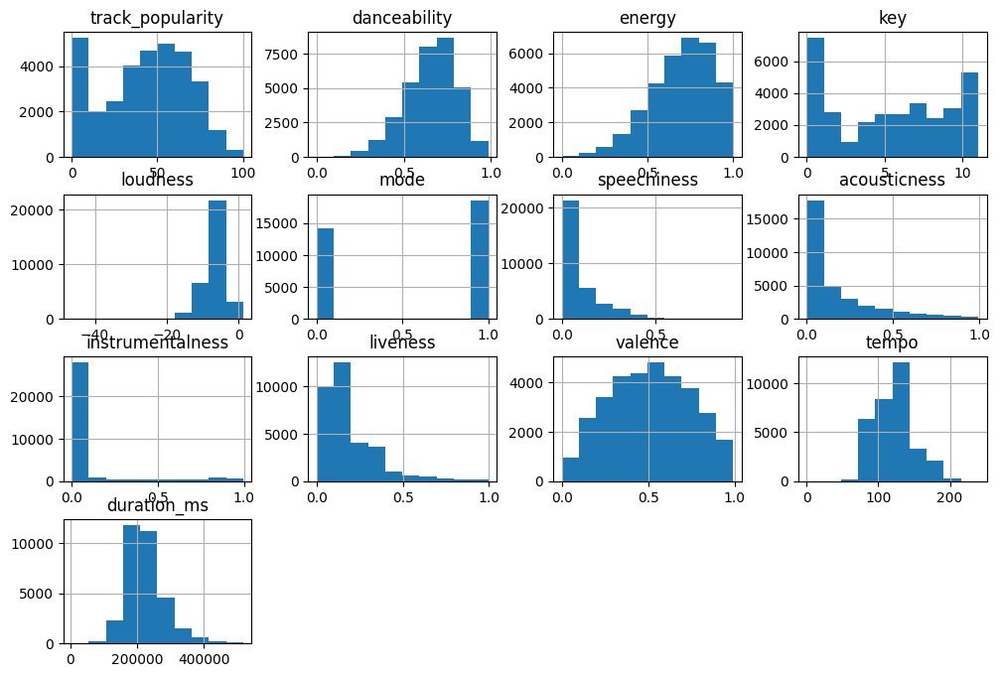

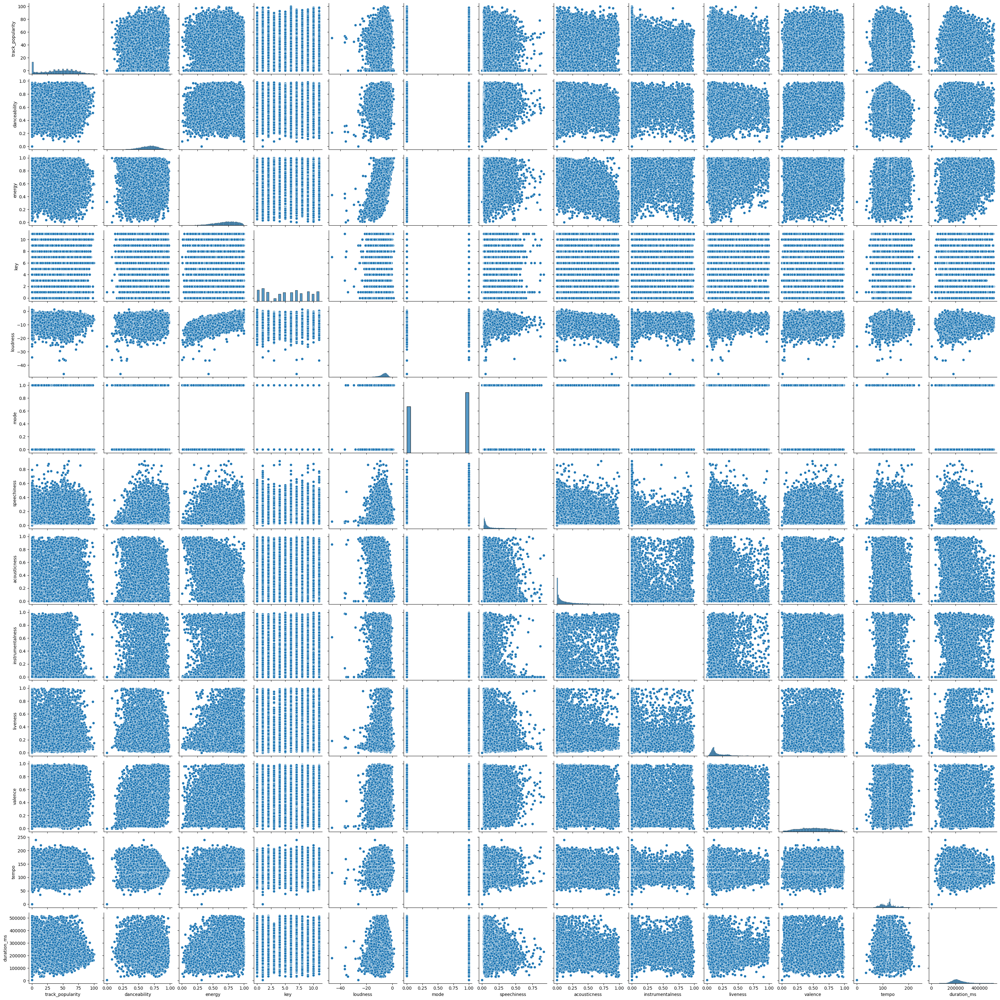

<ipython-input-5-0fba3a895999>:20: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = dfsongs.corr()


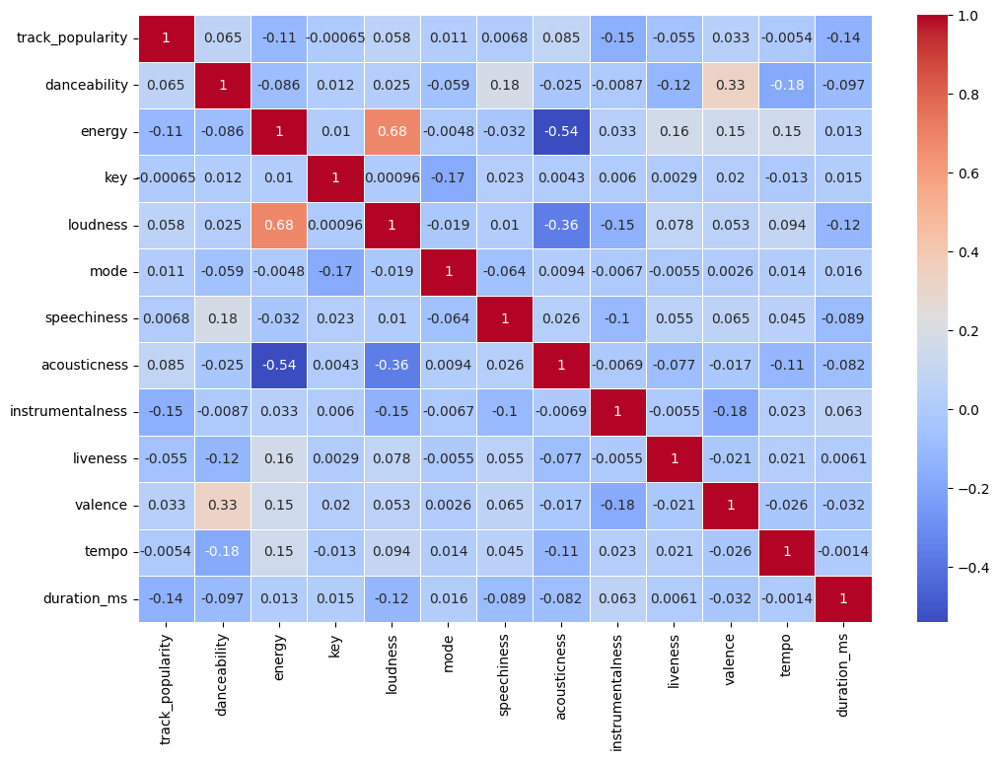

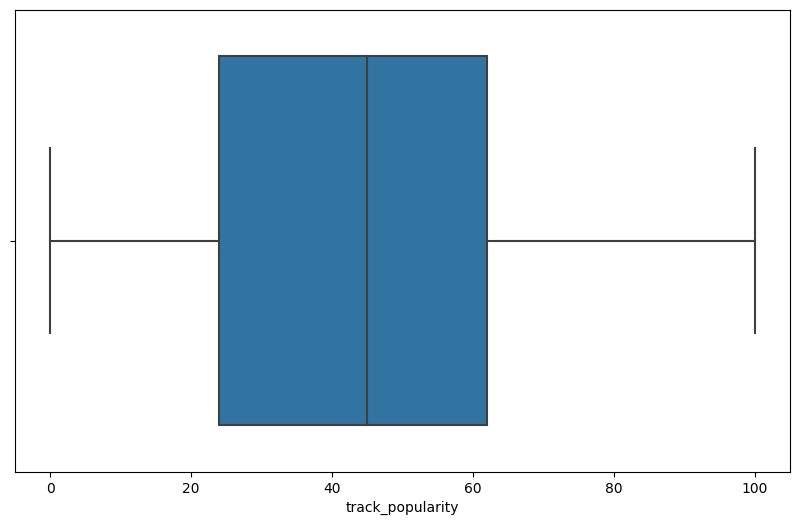

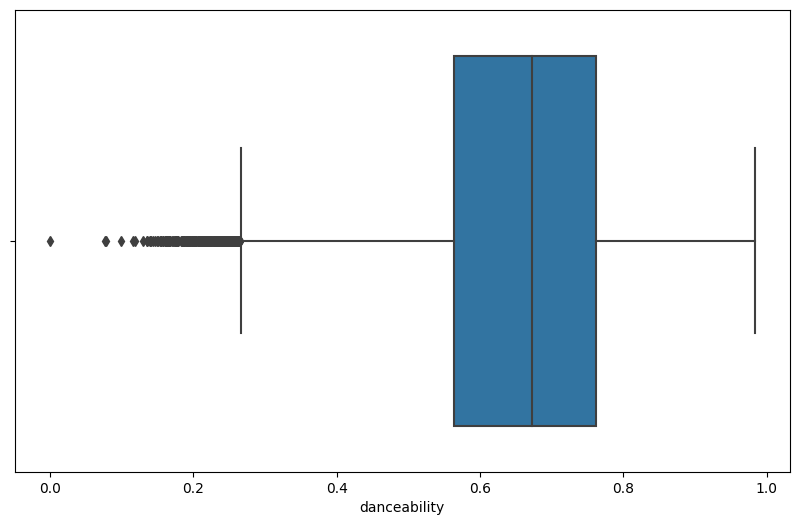

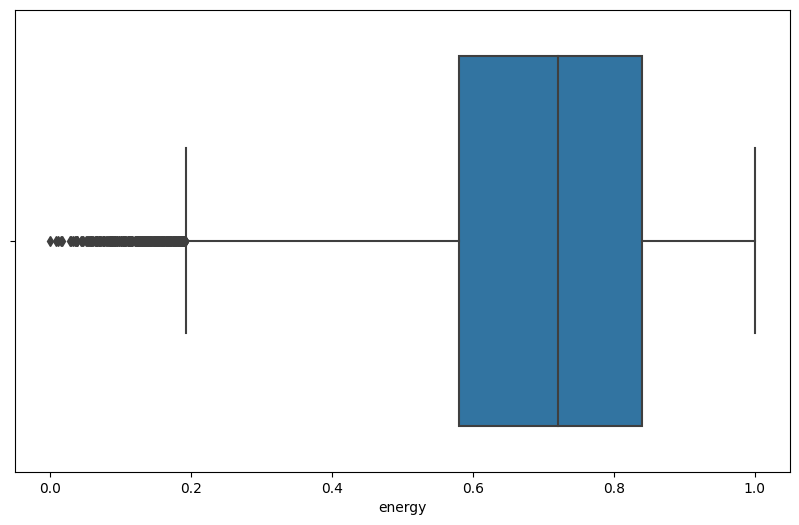

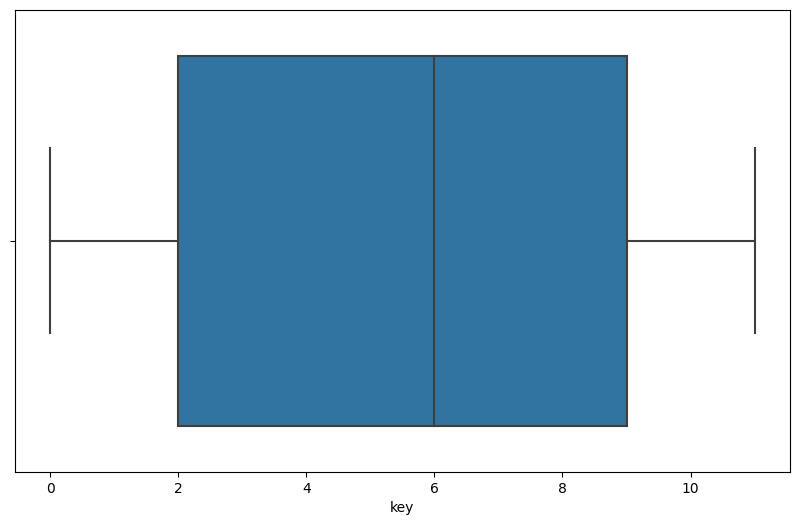

...

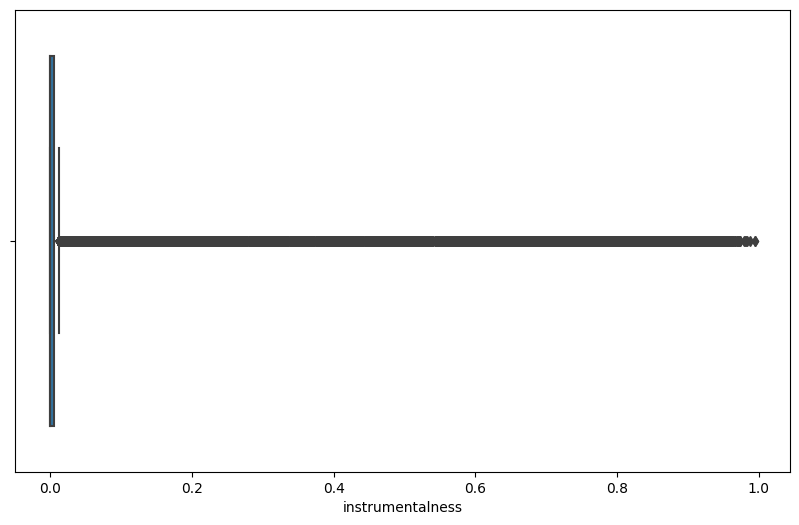

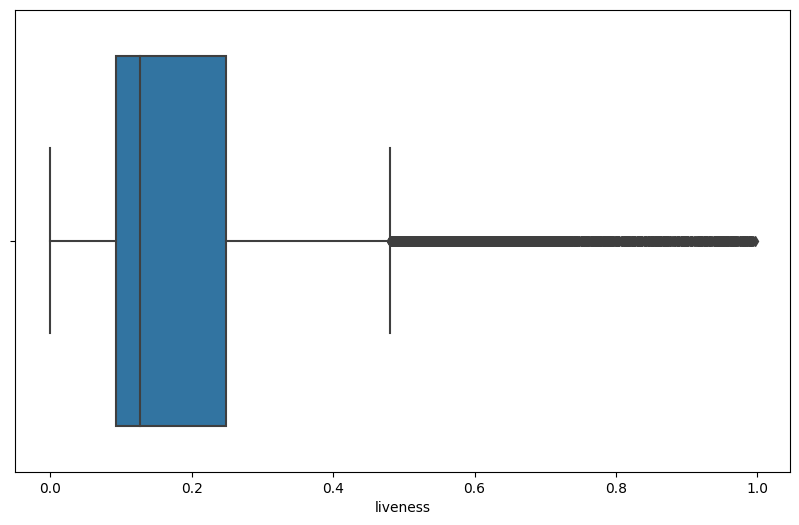

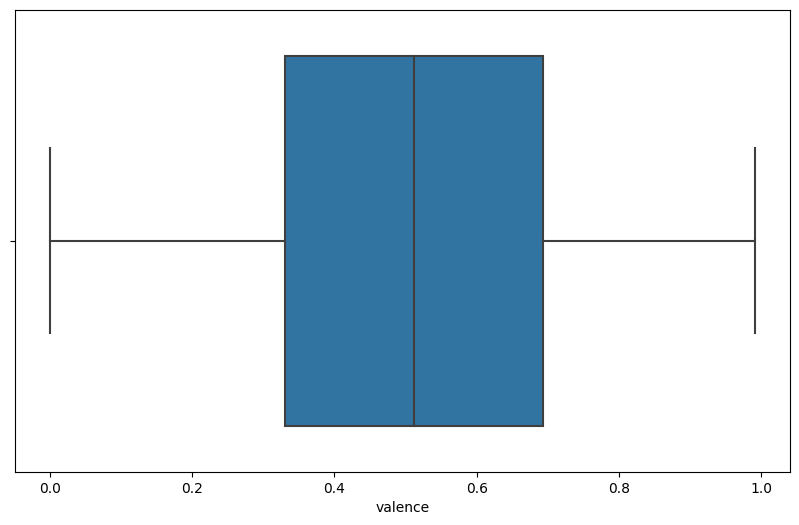

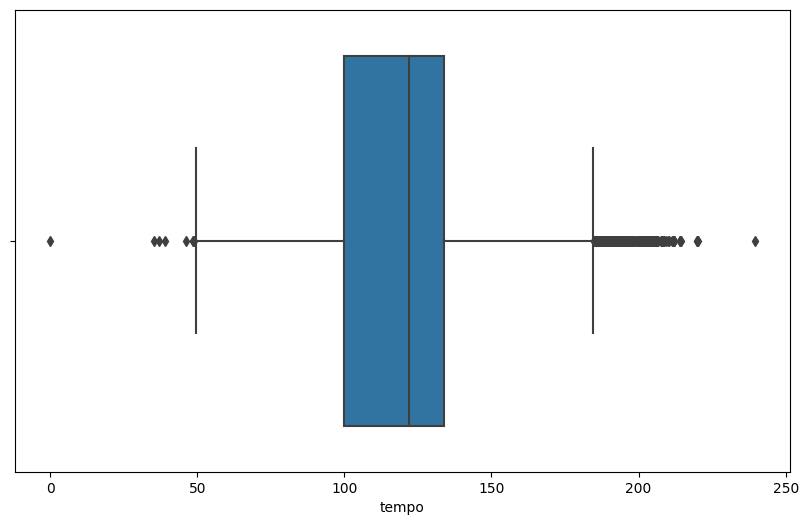

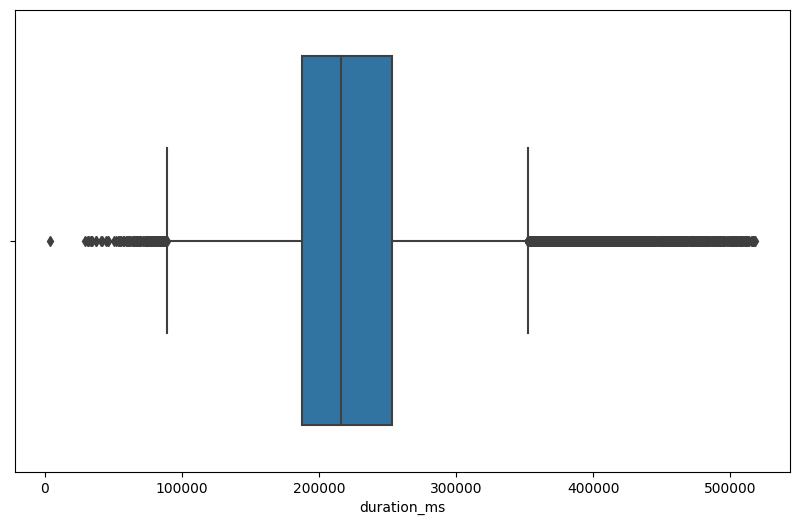

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,176616
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956,169093
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976,189052


In [5]:
# EDA for songs

# Display summary statistics of numeric columns
print(dfsongs.describe())

# Check for missing values
# 16 NAs in Top Genre. I can't really impute that to the mean because
# it is categorical. I will just get rid of those for genre analysis
print(dfsongs.isnull().sum())

# Univariate analysis: Histograms for numeric columns
dfsongs.hist(figsize=(12, 8))
plt.show()

# Bivariate analysis: Pairplot for numeric columns
sns.pairplot(dfsongs)
plt.show()

# Bivariate analysis: Heatmap for correlation matrix
correlation_matrix = dfsongs.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.show()

# Boxplot to identify outliers in numeric columns
for column in dfsongs.select_dtypes(include='number').columns:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=column, data=dfsongs)
    plt.show()

              year         bpm        nrgy        dnce          dB  \
count   667.000000  667.000000  667.000000  667.000000  667.000000   
mean   1994.967016  119.121439   61.394303   60.325337   -8.356822   
std      17.771374   25.030827   21.703963   15.051583    3.659509   
min    1945.000000   62.000000    6.000000   18.000000  -24.000000   
25%    1980.000000  101.500000   45.000000   51.000000  -11.000000   
50%    1998.000000  120.000000   64.000000   62.000000   -8.000000   
75%    2010.000000  134.000000   79.000000   71.000000   -6.000000   
max    2019.000000  199.000000  100.000000   96.000000   -1.000000   

             live         val         dur       acous        spch         pop  
count  667.000000  667.000000  667.000000  667.000000  667.000000  667.000000  
mean    18.188906   57.311844  224.002999   29.917541    6.179910   63.349325  
std     14.380929   24.400412   59.742591   28.865081    6.191199   13.725845  
min      2.000000    6.000000   98.000000    0.00

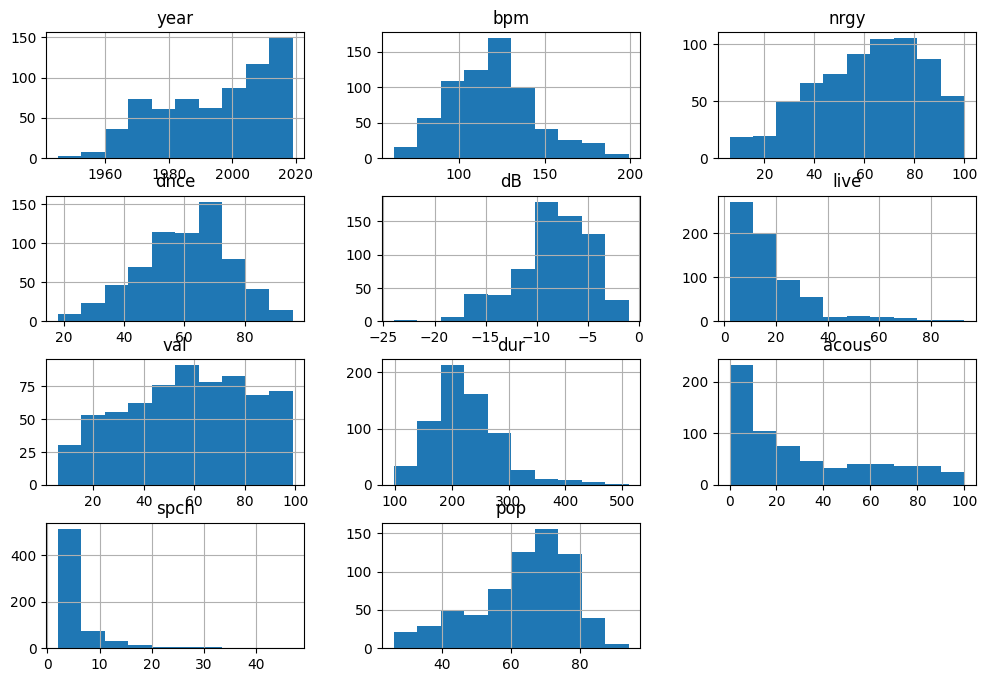

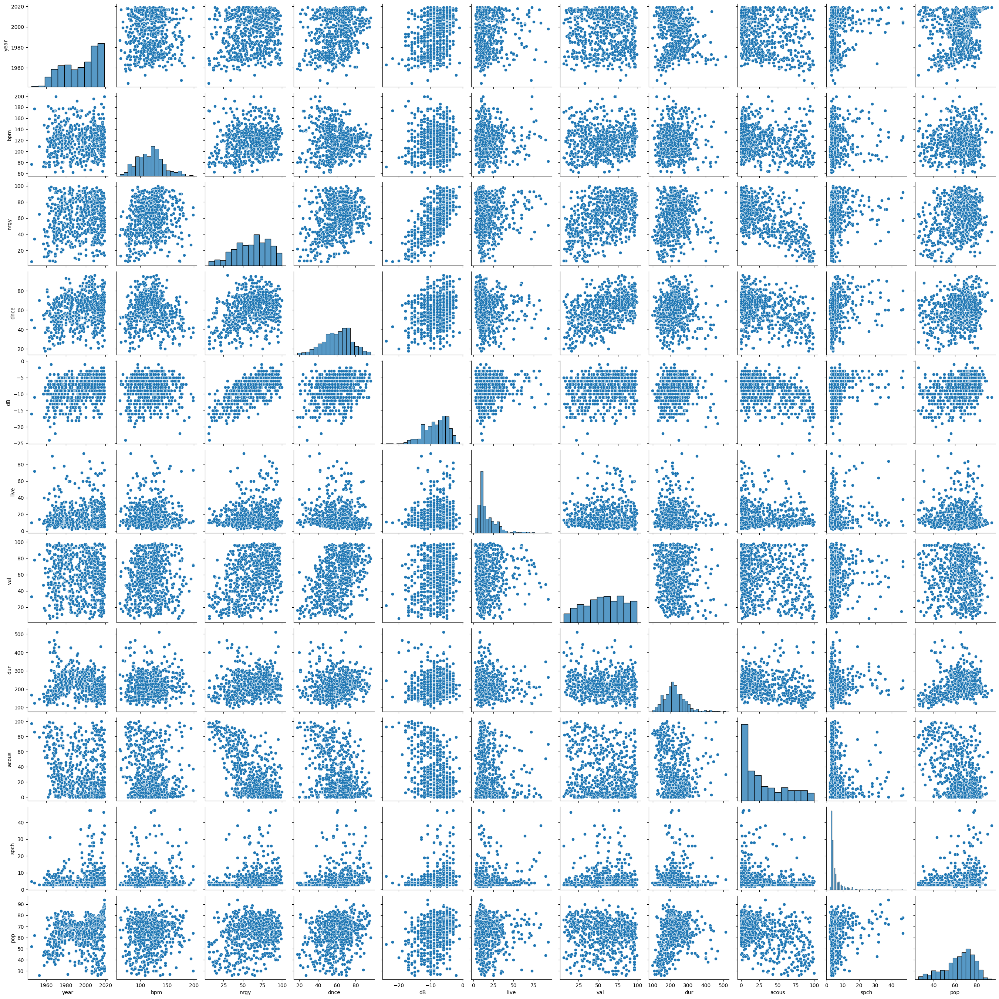

<ipython-input-15-1910b4112d34>:18: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = dec_df.corr()


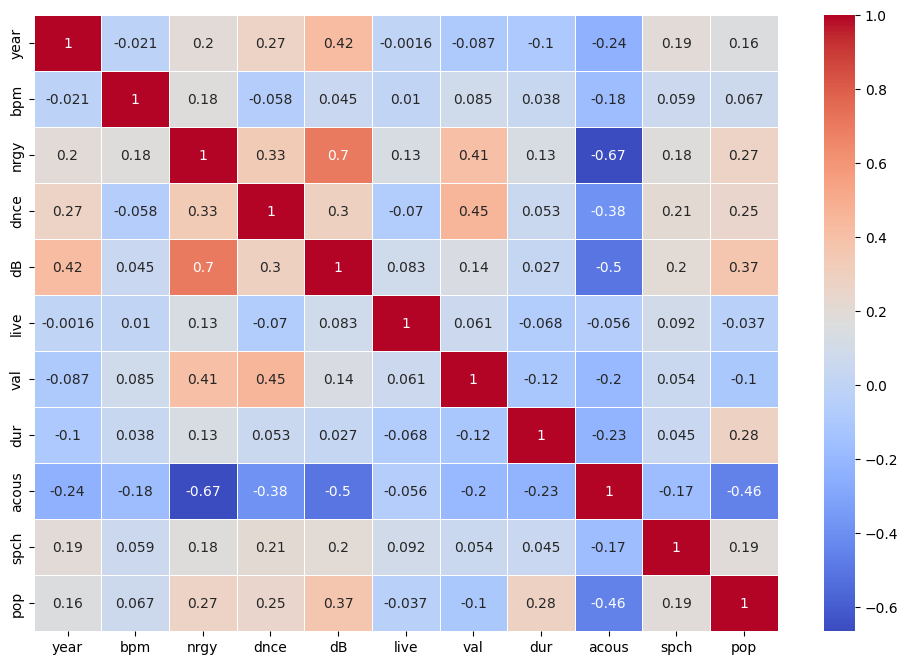

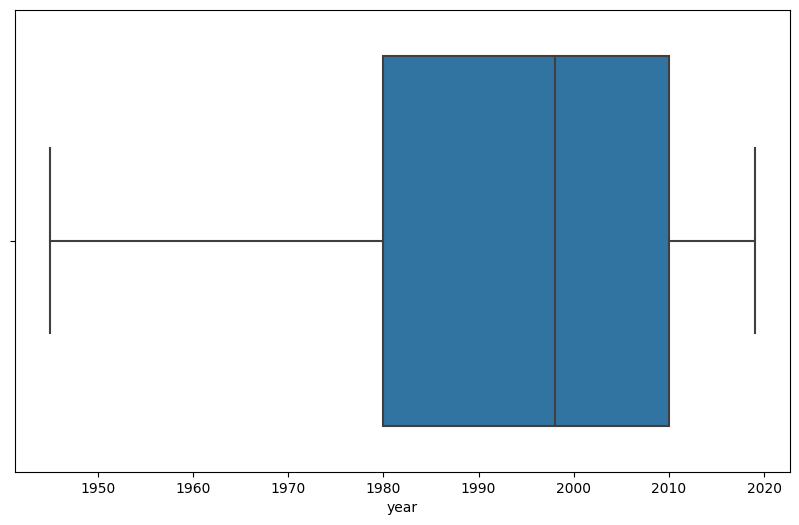

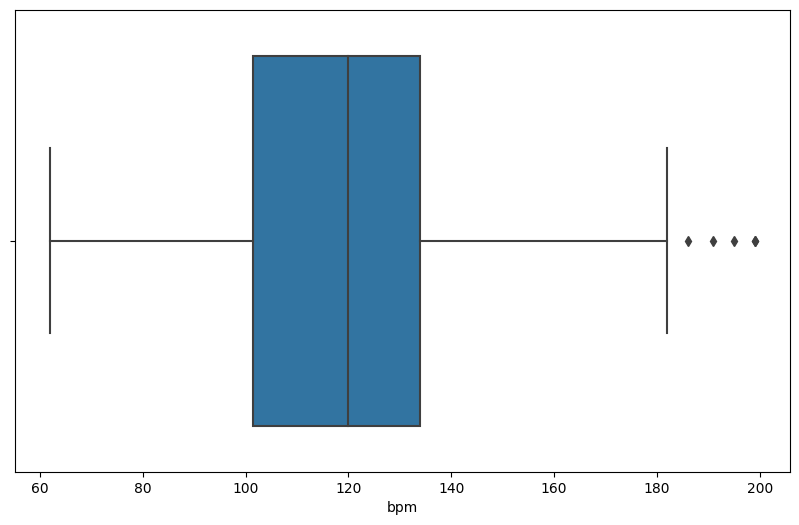

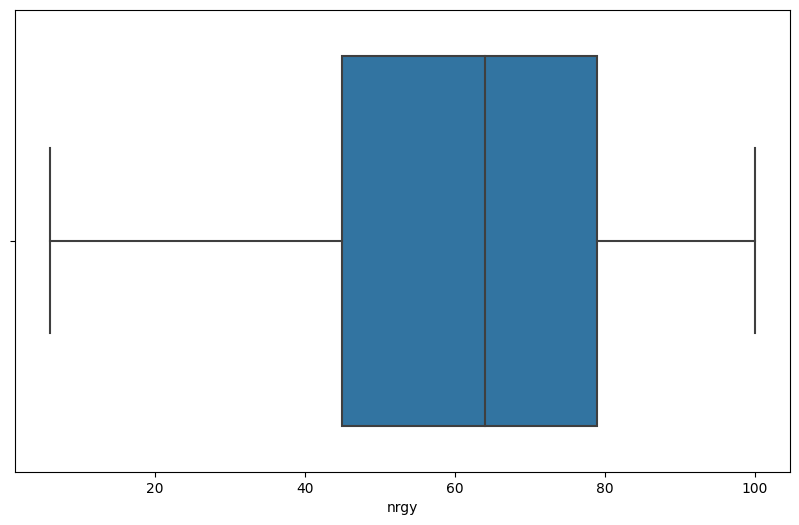

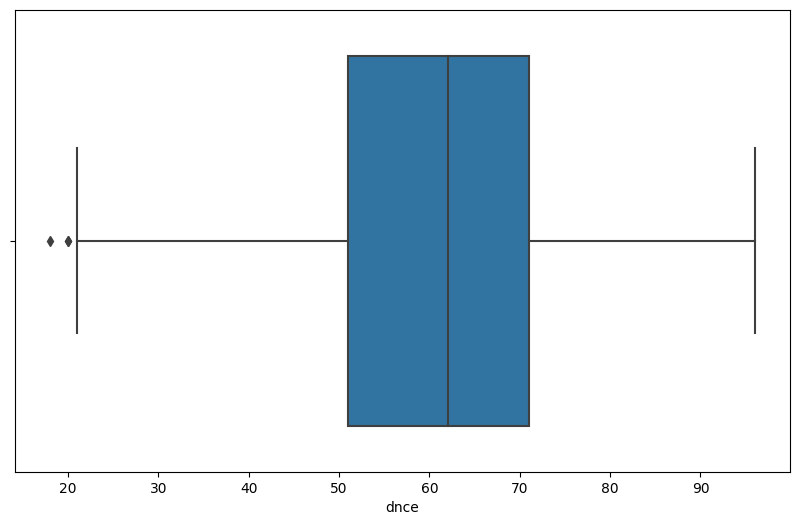

...

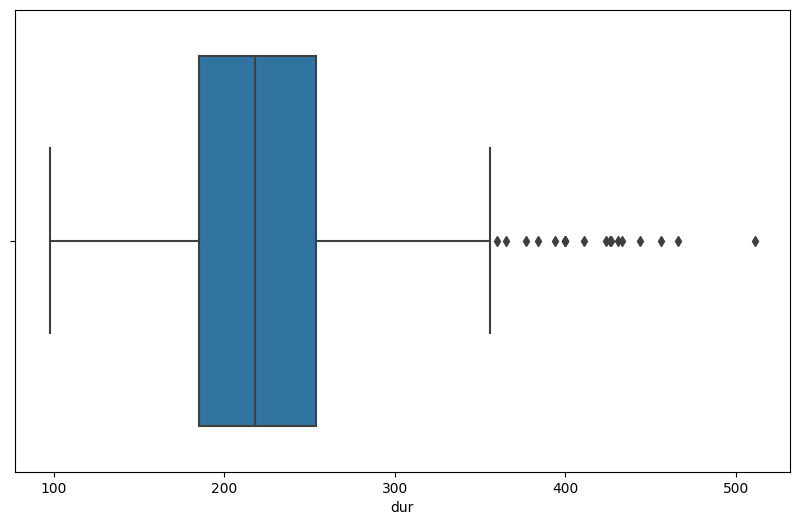

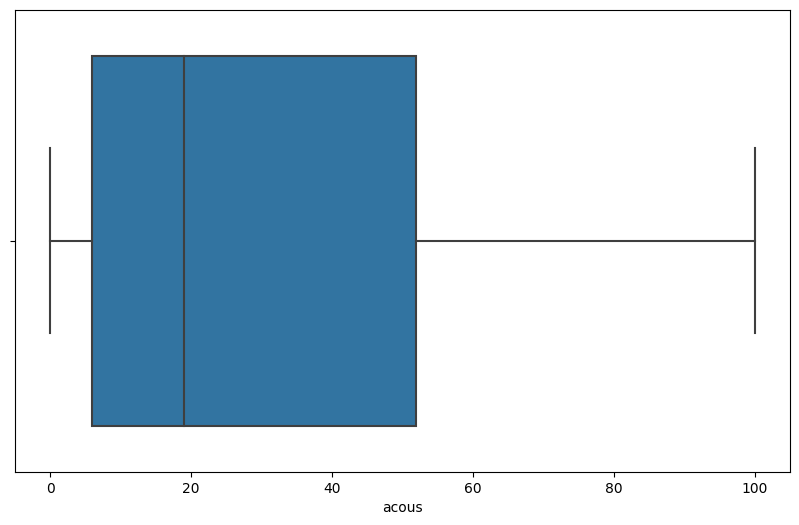

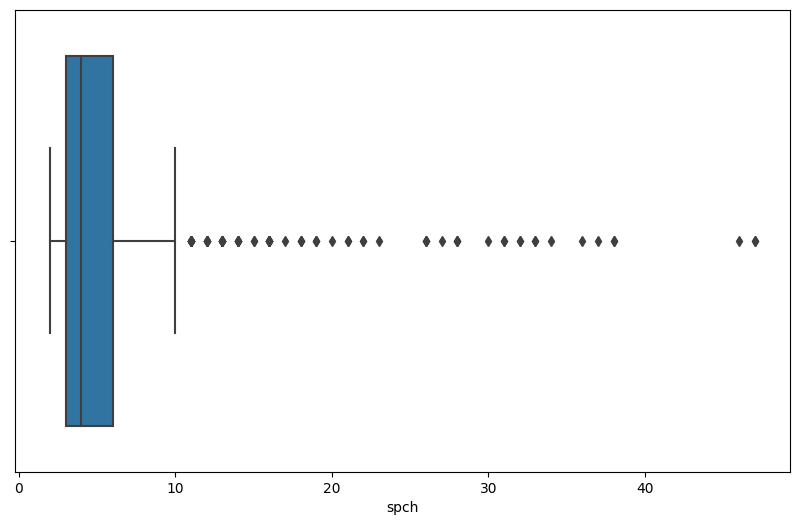

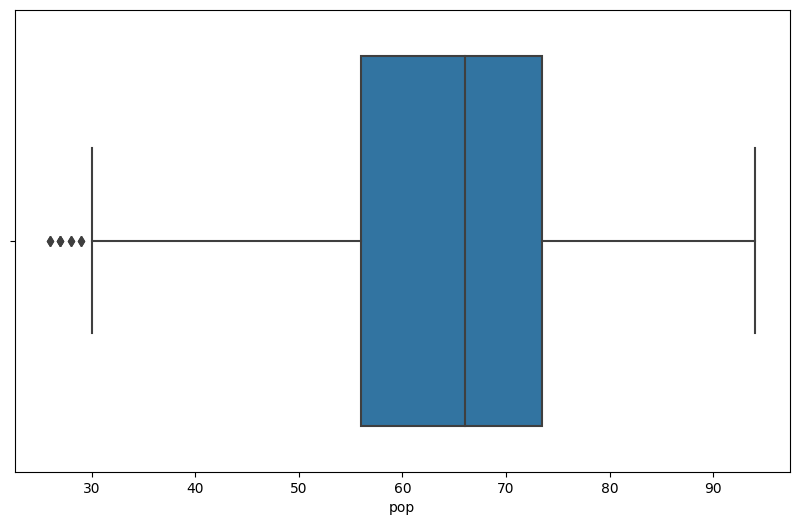

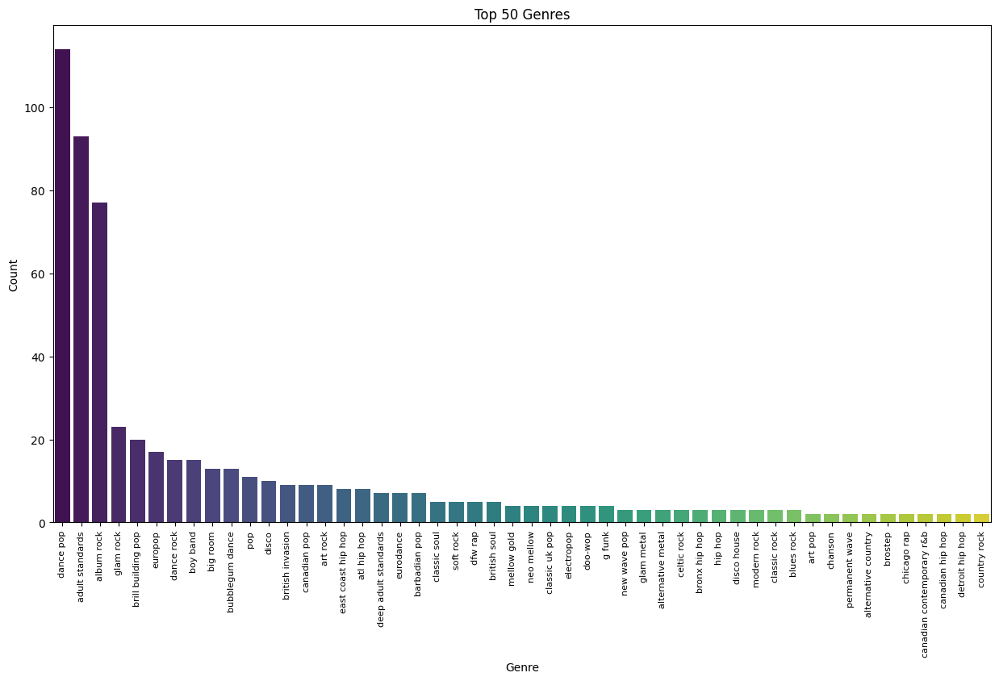

In [14]:
# Just top 50% of genres
top_genres = dec_df['top genre'].value_counts().head(50)

# Convert the series back to a DataFrame
top_genres_df = pd.DataFrame({'Genre': top_genres.index, 'Count': top_genres.values})

# Create a bar plot
plt.figure(figsize=(15, 8))
sns.barplot(x='Genre', y='Count', data=top_genres_df, palette='viridis')
plt.xticks(rotation=90, fontsize=8)
plt.xlabel('Genre')
plt.ylabel('Count')
plt.title('Top 50 Genres')
plt.show()